In [1]:
# this image aligner is based on pyimagesearch.com alignment course

In [2]:
import numpy as np
import cv2
import dlib
import time

ModuleNotFoundError: No module named 'cv2'

In [2]:
# Test transform detector/aligner class:
import torch
import torchvision
import torchvision.transforms as transforms
import sys
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure

In [4]:
flag_gpu_available = torch.cuda.is_available()

if flag_gpu_available:
    device = torch.device("cuda")
    print('================= cuda available ==================')
else:
    device = torch.device("cpu")
    print('================= using CPU ==================')

================= using CPU ==================


In [5]:

lfw_dataroot = '/media/expert/4T_Vol0/A_Work/Updated_New/FACEREC/Data/d.LFW dataset/lfw_224' # deformed,cropped version
pairs_path = '../../datasets/LFW_pairs.txt'

sys.path.append("../../")
from datasets.LFWDataset import LFWDataset


# using previous transforms as given in test_model_lfw_far.py:
lfw_transforms = transforms.Compose([
    transforms.Resize(size=224),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.6068, 0.4517, 0.3800],
        std=[0.2492, 0.2173, 0.2082])
    ])


# torch.utils.data.DataLoader is an iterator which provides batching data, shuffling, loading in parallel using multiprocessing workers
lfw_dataloader = torch.utils.data.DataLoader(
    dataset=LFWDataset(
        dir=lfw_dataroot,
        pairs_path=pairs_path, # '../datasets/LFW_pairs.txt'
        transform=lfw_transforms
        ),
        batch_size=128, # default = 256; 160 - allows running under 2GB VRAM
        num_workers=2,
        shuffle=False
    )

train_iter = iter(lfw_dataloader)
print(type(train_iter))
# we can look at images and labels of *batch size* by extracting data .next() method:
images = train_iter.next()
print('images batch size = {}'.format(len(images[0])))
print(len(images[0])) # tensor : (batchsize, channels, height, width)
grid = torchvision.utils.make_grid(images[0]) # makes a single image (grid)
from matplotlib.pyplot import figure
figure(num=None, figsize=(16, 32), dpi=80, facecolor='w', edgecolor='k')
transp = grid.numpy().transpose((1, 2, 0))  # putting the channels last by permuting
print("Shape of the ndarray:",transp.shape)
print("Number of dimensions/axis of the ndarray:",transp.ndim)
print("Minimum value in the whole array:%d"%(transp.min())) 
print("Maximum value in the whole array:%d"%(transp.max()))  

<class 'torch.utils.data.dataloader._MultiProcessingDataLoaderIter'>
images batch size = 128
128
Shape of the ndarray: (3618, 1810, 3)
Number of dimensions/axis of the ndarray: 3
Minimum value in the whole array:-2
Maximum value in the whole array:2


<Figure size 1280x2560 with 0 Axes>

In [14]:
# get our aligner:
from transform_align import transform_align # if you use: from YourClassParentDir.YourClass import YourClass   # means Class YourClass
# or use YourClass.YourClass(), it works
# or use YourClass.YourClass(), it works

# RAW LFW dataset path:
lfw_dataroot1='/media/expert/4T_Vol0/A_Work/Updated_New/FACEREC/Data/d.LFW dataset/lfw_raw'
# openCV predictor weights:
landmark_predictor_weights = './data_weights/shape_predictor_68_face_landmarks.dat'
face_detector_path = './data_weights'

# desiredFaceWidth, height and desiredLeftEye work together to produce centered aligned faces
# desiredLeftEye (x,y) says how the face moves in the heightxwidth window. bigger y moves the face down
# bigger x zooms-out the face and severe values migh flip the face upside down, you wan it in range [0.2;0.36]
desiredFaceHeight = 224
desiredFaceWidth = 224
desiredLeftEye=(0.32, 0.36) # Note: with these parameters it barely fits in the DNN window, sometimes the chin is outside !!

# create explicit instance of our transform_align class, we need it for test later:
tf_align = transform_align(landmark_predictor_weight_path=landmark_predictor_weights, face_detector_path=face_detector_path,
                           desiredFaceWidth=desiredFaceWidth, desiredFaceHeight=desiredFaceHeight,
                           desiredLeftEye=desiredLeftEye)
tf_resize = transforms.Resize(size=(224,224))
# compose it in our new transform:
lfw_transforms1 = transforms.Compose([
    tf_align,
    tf_resize,
    # transforms.Resize(size=(224,224)),
    #transforms.Normalize(mean=[0.6068, 0.4517, 0.3800],std=[0.2492, 0.2173, 0.2082]),
    #transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor()
    ])

# Note: we omitted transforms.Normalize to show tensors in natural colors, you might want to add it if you are going to train/infer


# our new dataloader using align:
lfw_dataloader1 = torch.utils.data.DataLoader(
    dataset=LFWDataset(
        dir=lfw_dataroot1,
        pairs_path=pairs_path, # '../datasets/LFW_pairs.txt'
        transform=lfw_transforms1
        ),
        batch_size=128, # default = 256; 160 - allows running under 2GB VRAM
        num_workers=2,
        shuffle=False
    )


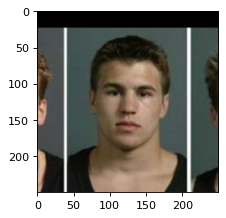

In [15]:
# Get a test image:
Zach_Parise_path = '/media/expert/4T_Vol0/A_Work/Updated_New/FACEREC/Data/d.LFW dataset/lfw_raw/Zach_Parise/Zach_Parise_0001.jpg'
frame = cv2.imread(Zach_Parise_path)
from PIL import Image
a_pil_img = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
from matplotlib.pyplot import figure
figure(num=None, figsize=(5, 3), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(a_pil_img)

dtime:  0.006946086883544922
rectangles[[(77, 89) (181, 192)]]


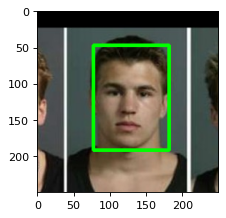

In [16]:
# Test detector:
cv2img = np.array(a_pil_img) # PIL -> OpenCV
t1 = time.time()
faces, gray_img = tf_align._detect(cv2img)
print ('dtime: ',time.time() - t1)
print(faces)
for face in faces:
    x1 = face.left()
    y1 = face.top() 
    x2 = face.right()
    y2 = face.bottom()
    # Gele: I artificially extend the bbox to capture the whole head:
    h = y2 - y1 # height
    w = x2 - x1 # width
    y1 = max(0, y1 - int ( 0.4 * h )) # add 40% of total height to y1 and clamp to 0
    h = y2 - y1 # recalc.
    # draw selection frame
    cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 3) # green frame BGR
a_pil_img1 = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
from matplotlib.pyplot import figure
figure(num=None, figsize=(5, 3), dpi=80, facecolor='w', edgecolor='k')
plt.imshow(a_pil_img1)

(224, 224)


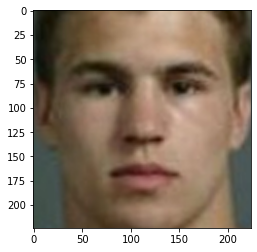

In [17]:
# test aligner:
a_pil_face = tf_align(a_pil_img)
plt.imshow(a_pil_face)
print(a_pil_face.size)

In [18]:
# Load and display old transform output with cropped LFW:
train_iter = iter(lfw_dataloader)
print(type(train_iter))
# we can look at images and labels of *batch size* by extracting data .next() method:
images = train_iter.next()
print('images batch size = {}'.format(len(images[0])))
print(len(images[0])) # tensor : (batchsize, channels, height, width)
grid = torchvision.utils.make_grid(images[0]) # makes a single image (grid)
from matplotlib.pyplot import figure
figure(num=None, figsize=(16, 32), dpi=80, facecolor='w', edgecolor='k')
transp = grid.numpy().transpose((1, 2, 0))  # putting the channels last by permuting
print("Shape of the ndarray:",transp.shape)
print("Number of dimensions/axis of the ndarray:",transp.ndim)
print("Minimum value in the whole array:%d"%(transp.min())) 
print("Maximum value in the whole array:%d"%(transp.max()))  

<class 'torch.utils.data.dataloader._MultiProcessingDataLoaderIter'>
images batch size = 128
128
Shape of the ndarray: (3618, 1810, 3)
Number of dimensions/axis of the ndarray: 3
Minimum value in the whole array:-2
Maximum value in the whole array:2


<Figure size 1280x2560 with 0 Axes>

In [19]:
# move [-2;2] range to [0;1] so the images render:
transp = transp + 2
transp = transp* 0.25 # divide by 4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


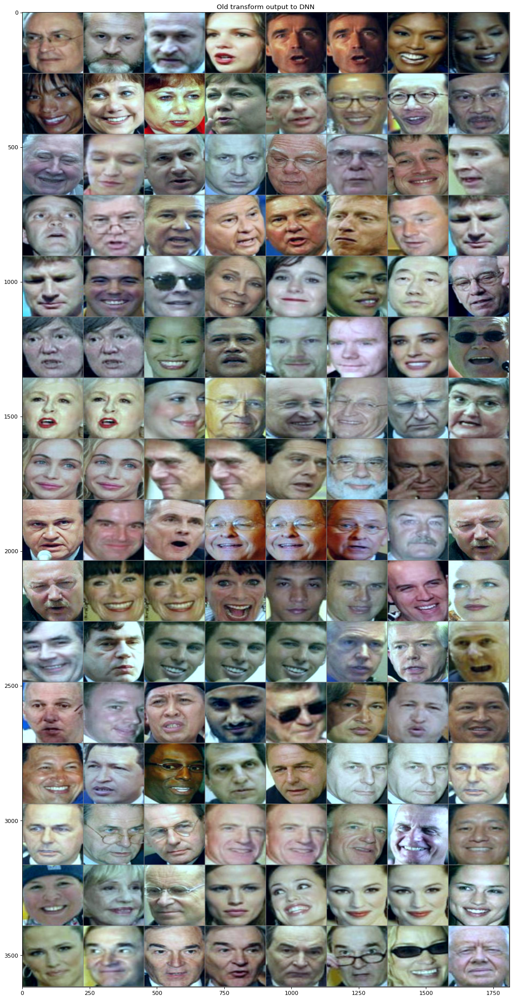

In [20]:
# display
figure(num=None, figsize=(16, 32), dpi=80, facecolor='w', edgecolor='k')
plt.title("Old transform output to DNN")
plt.imshow(transp) # display old transform output with cropped LFW

In [21]:
train_iter1 = iter(lfw_dataloader1)
# we can look at images and labels of *batch size* by extracting data .next() method:
images1 = train_iter1.next()


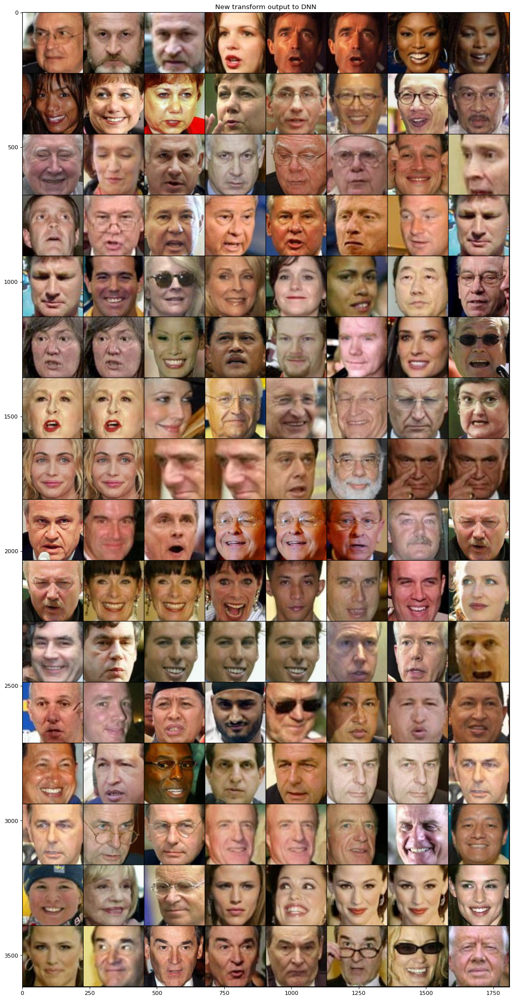

In [22]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(16, 32), dpi=80, facecolor='w', edgecolor='k')
grid1 = torchvision.utils.make_grid(images1[0])
plt.title("New transform output to DNN")
plt.imshow(grid1.numpy().transpose((1, 2, 0)))

But you want **stretched** faces, because you have **redundand weights** with **square** input you want to make use of ?

In [23]:
# desiredFaceWidth, height and desiredLeftEye work together to produce centered aligned faces
# desiredLeftEye (x,y) says how the face moves in the heightxwidth window. bigger y moves the face down
# bigger x zooms-out the face and severe values migh flip the face upside down, you wan it in range [0.2;0.36]
desiredFaceHeight = 448 # set non-equal width, height so the tf_resize stretch the faces, we select bigger than 224 values so we don't lose too much of the image quality
desiredFaceWidth = 352
desiredLeftEye=(0.28, 0.35) 
 
# create explicit instance of our transform_align class, we need it for test later:
tf_align2 = transform_align(landmark_predictor_weight_path=landmark_predictor_weights, desiredFaceWidth=desiredFaceWidth, desiredFaceHeight=desiredFaceHeight,
                           desiredLeftEye=desiredLeftEye)


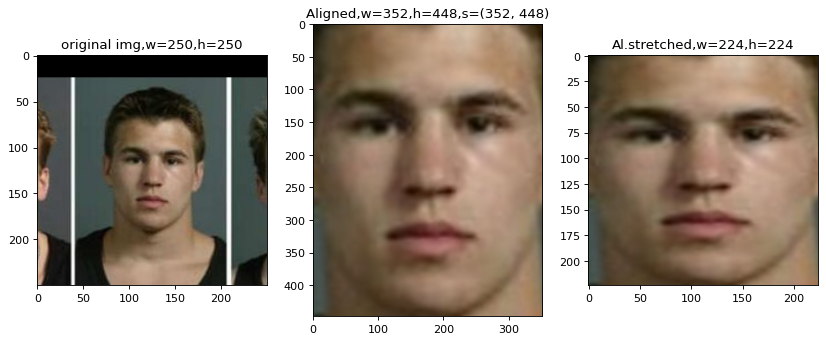

In [24]:
def cm_to_inch(value):
    return value/2.54

frame = cv2.imread(Zach_Parise_path)
from PIL import Image
a_pil_img = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
from matplotlib.pyplot import figure

# test aligner:
al_pil_face = tf_align2(a_pil_img)

# test non-uniform resize - here you get stretched output:
als_pil_face = tf_resize(al_pil_face)


fig, axs = plt.subplots(1, 3)
fig.figsize=(18, 16);fig.dpi=80
#fig.suptitle('Face{}'.format(face))
axs[0].figure.set_size_inches(cm_to_inch(32),cm_to_inch(32))
#axs[0].plot(x, y)
axs[0].set_title("original img,w={},h={}".format(a_pil_img.width,a_pil_img.height))
axs[0].imshow(a_pil_img)
#axs[1].plot(x, y) 
axs[1].set_title("Aligned,w={},h={},s={}".format(al_pil_face.width, al_pil_face.height, al_pil_face.size))
axs[1].imshow(al_pil_face)
#axs[2].plot(x + 1, y + 1)
axs[2].set_title("Al.stretched,w={},h={}".format(als_pil_face.width, als_pil_face.height))
axs[2].imshow(als_pil_face)


In [25]:
# Now let see more stretched faces:
# compose it in our new transform:
lfw_transforms2 = transforms.Compose([
    tf_align2,
    tf_resize,
    #transforms.Normalize(mean=[0.6068, 0.4517, 0.3800],std=[0.2492, 0.2173, 0.2082]),
    #transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor()
    ])

# new transforms need new dataloader:
lfw_dataloader2 = torch.utils.data.DataLoader(
    dataset=LFWDataset(
        dir=lfw_dataroot1,
        pairs_path=pairs_path, # '../datasets/LFW_pairs.txt'
        transform=lfw_transforms2
        ),
        batch_size=128, # default = 256; 160 - allows running under 2GB VRAM
        num_workers=2,
        shuffle=False
    )

train_iter2 = iter(lfw_dataloader2)
# we can look at images and labels of *batch size* by extracting data .next() method:
images2 = train_iter2.next()

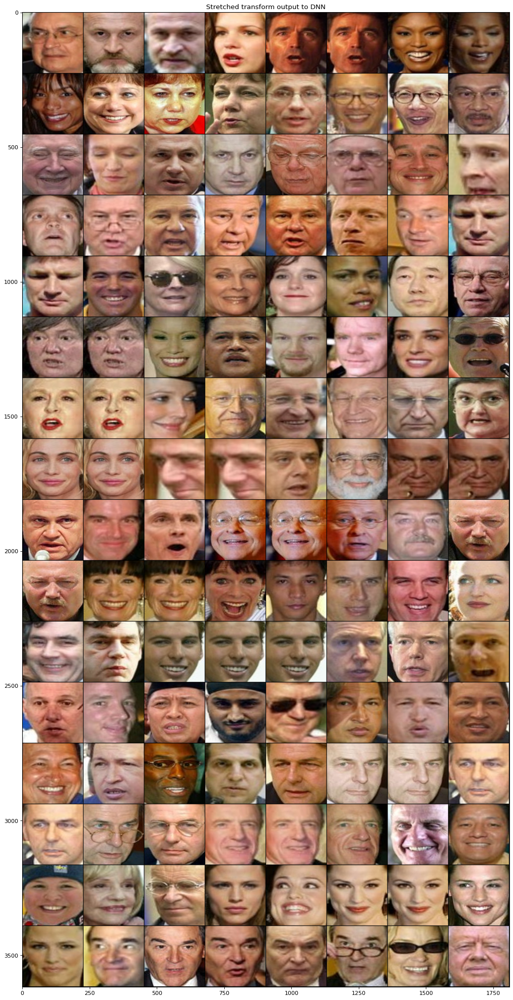

In [26]:
from matplotlib.pyplot import figure
figure(num=None, figsize=(16, 32), dpi=80, facecolor='w', edgecolor='k')
grid1 = torchvision.utils.make_grid(images2[0])
plt.title("Stretched transform output to DNN")
plt.imshow(grid1.numpy().transpose((1, 2, 0)))

In [27]:
# Previous version fails to detect some faces, so below I have some tests while developed the current

In [28]:
# test with undetected images
lfw_transforms3 = transforms.Compose([
    transforms.ToTensor()
    ])

# new transforms need new dataloader:
lfw_dataloader3 = torch.utils.data.DataLoader(
    dataset=LFWDataset(
        dir=lfw_dataroot1,
        pairs_path=pairs_path, # '../datasets/LFW_pairs.txt'
        transform=lfw_transforms3
        ),
        batch_size=128, # default = 256; 160 - allows running under 2GB VRAM
        num_workers=2,
        shuffle=False
    )

def crop_center(img,W,H):
    iH,iW,_ = img.shape
    offsetW = (iW - W) // 2;
    offsetH = (iH - H) // 2;
    return img[offsetH:offsetH+H,offsetW:offsetW+W]

train_iter3 = iter(lfw_dataloader3)
# we can look at images and labels of *batch size* by extracting data .next() method:
images3 = train_iter3.next()

img110p = images3[0][110]
#imgPIL110 = img111p.numpy().transpose((1, 2, 0))
imgPIL110=torchvision.transforms.ToPILImage()(img110p)
print(imgPIL110)
#plt.imshow(imgPIL110)
#print(imgPIL110.max(),imgPIL110.min())
cv2img = np.array(imgPIL110) # PIL -> OpenCV
print(cv2img.shape)
# Test detector:
faces, gray_img = tf_align2._detect(cv2img)
if len(faces) == 0:
    print("-=== face not detected ===-")
    crop_img = crop_center(cv2img,224,224)
    plt.imshow(crop_img)
    

<PIL.Image.Image image mode=RGB size=250x250 at 0x7F5C1C5933D0>
(250, 250, 3)


<dnn_Net 0x7f5c3d10fdd0>
dtime:  0.019221067428588867
0.999892
0.999892
[rectangle(59,54,198,211)]
(250, 250)


<Figure size 400x240 with 0 Axes>

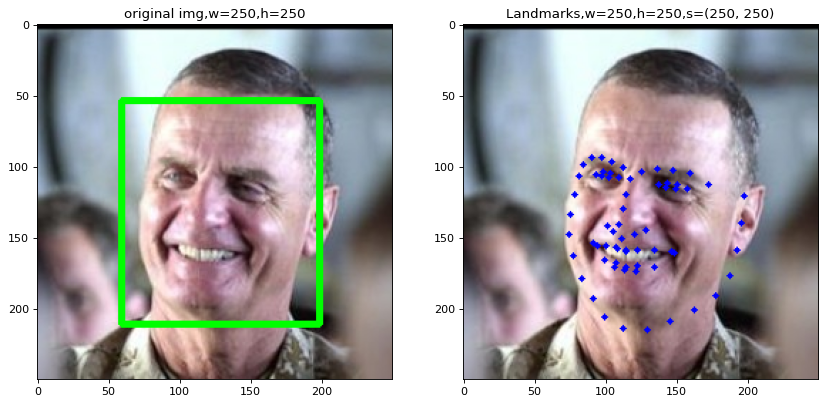

In [29]:
# try detector which always returns faces
from collections import namedtuple
cf_prototxt='./data_weights/res10_300x300_ssd_iter_140000.txt'
cf_model='./data_weights/res10_300x300_ssd_iter_140000_fp16.caffemodel'
ResNet10SSDdetector = cv2.dnn.readNetFromCaffe(cf_prototxt, cf_model)
print(ResNet10SSDdetector)
def dl_detector(image):
    # Facial landmarks with DL

    # Finding height and width of frame
    (h, w) = image.shape[:2]
    
    total_faces = 0
    # https://docs.opencv.org/trunk/d6/d0f/group__dnn.html#ga29f34df9376379a603acd8df581ac8d7
    # # This is based on SSD deep learning pretrained model
    t1 = time.time()
    inputBlob = cv2.dnn.blobFromImage(cv2.resize(image, (300, 300)), 1, (300, 300), (104, 177, 123), True)   
    #print(inputBlob.shape)
    ResNet10SSDdetector.setInput(inputBlob)
    detections = ResNet10SSDdetector.forward()
    print ('dtime: ',time.time() - t1)
    faces=[];print(detections[0, 0, 0, 2])
    for i in range(0, detections.shape[2]):

        # Probability of prediction
        prediction_score = detections[0, 0, i, 2]
        print(prediction_score)
        
        # compute the (x, y)-coordinates of the bounding box for the
        # object
        box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
        (x1, y1, x2, y2) = box.astype("int")
        

        # For better landmark detection
        y1=int(y1 * 1.15)
        x2 = int(x2 * 1.05)
        x1 = x1 * 0.82

        dlibrect = dlib.rectangle(int(x1), y1, x2, y2)
        faces.append( dlibrect )
        break
        
    return faces





imgBGR = cv2.cvtColor(cv2img, cv2.COLOR_RGB2BGR) # PIL images are RGB
face_box=dl_detector(cv2img)
print(face_box)
# draw detected:
for face in face_box:
    x1, y1, x2, y2 = face.left(),face.top(),face.right(),face.bottom()
    # Gele: I artificially extend the bbox to capture the whole head:
    h = y2 - y1 # height
    w = x2 - x1 # width
    #y1 = max(0, y1 - int ( 0.4 * h )) # add 40% of total height to y1 and clamp to 0
    #h = y2 - y1 # recalc.
    # draw selection frame
    cv2.rectangle(imgBGR, (x1, y1), (x2, y2), (0, 255, 0), 3) # green frame BGR
a_pil_img1 = Image.fromarray(cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB))
from matplotlib.pyplot import figure
figure(num=None, figsize=(5, 3), dpi=80, facecolor='w', edgecolor='k')
#plt.imshow(a_pil_img1)
print(imgBGR.shape[:2])


landmarks_np = tf_align2._get_landmarks(gray_img, face_box[0])
imgBGR = cv2.cvtColor(cv2img, cv2.COLOR_RGB2BGR) # PIL images are RGB
# loop over all facial landmarks and convert them to tuples of (x, y)-coordinates
for i in range(0, 68):
    # draw landmarks:
    cv2.circle(imgBGR, (landmarks_np[i][0],landmarks_np[i][1]), 2, (255, 0, 0), -1)
a_pil_img2 = Image.fromarray(cv2.cvtColor(imgBGR, cv2.COLOR_BGR2RGB))
#plt.imshow(a_pil_img1)

fig, axs = plt.subplots(1, 2)
fig.figsize=(18, 16);fig.dpi=80
#fig.suptitle('Face{}'.format(face))
axs[0].figure.set_size_inches(cm_to_inch(32),cm_to_inch(32))
#axs[0].plot(x, y)
axs[0].set_title("original img,w={},h={}".format(a_pil_img1.width,a_pil_img1.height))
axs[0].imshow(a_pil_img1)
#axs[1].plot(x, y) 
axs[1].set_title("Landmarks,w={},h={},s={}".format(a_pil_img2.width, a_pil_img2.height, a_pil_img2.size))
axs[1].imshow(a_pil_img2)


In [63]:
# STOP ! WAIT !

In [60]:
# STOP ! WAIT !